<a href="https://colab.research.google.com/github/AdindaRahajengSilviaPranesti/AdindaRahajengSP_PCVK/blob/main/Week11.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**🌺Jobsheet 11:Object Detection - Indonesia**
####- **🌼Adinda Rahajeng Silvia Pranesti🌼**
###- **🌼2141720158 / 02**
###- **🌼3I-TI**
###- **🌼PCVK**
**Jobsheet 11 - Object Detection NewURL**

###**🌺D. LATIHAN PRAKTIKUM**


Catatan: Untuk gambar pada praktikum ini menggunakan gambar pada link berikut:
https://drive.google.com/drive/folders/1d4U8FVnQ0Hq_K1Sy4XJvQsgq12ZjvmgK?usp=sharing
1. Buka https://colab.research.google.com/. Setelah dipastikan bahwa google Colab
terhubung dengan Github Anda, buat notebook baru dan beri nama“Week11.ipynb”.
Kemudian import beberapa library dan akses folder yang ada di Drive Anda dengan
cara sebagai berikut.


**Object Detection**


Metode yang digunakan :
- Template Matching
- Edge Detection
- Corner Detection
- Grid Detection
- Contour Detection

In [ ]:
# Import librari yang dibutuhkan
import cv2 as cv
import numpy as np
from matplotlib import pyplot as plt

In [ ]:
# Drive access
from google.colab import drive

drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


2. Implementasikan 6 metode template matching pada OpenCV dengan menggunakan
gambar cats_and_bunnies.jpg dan cat2_templatejpg.jpg sebagai templatenya.

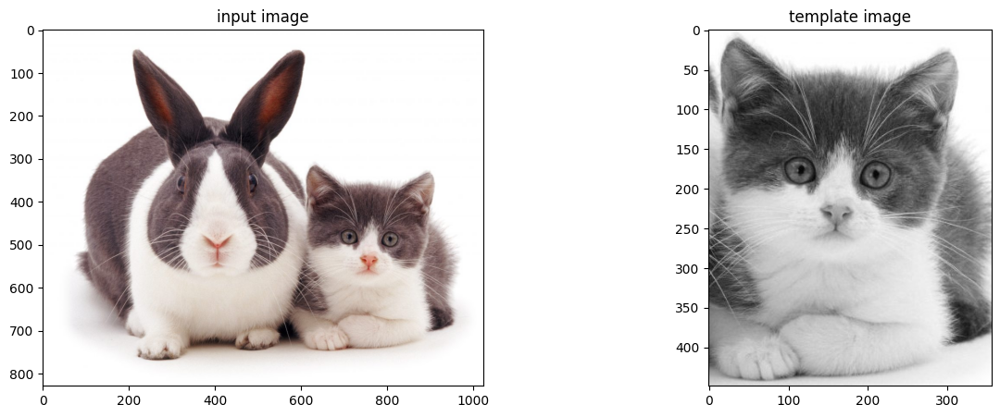

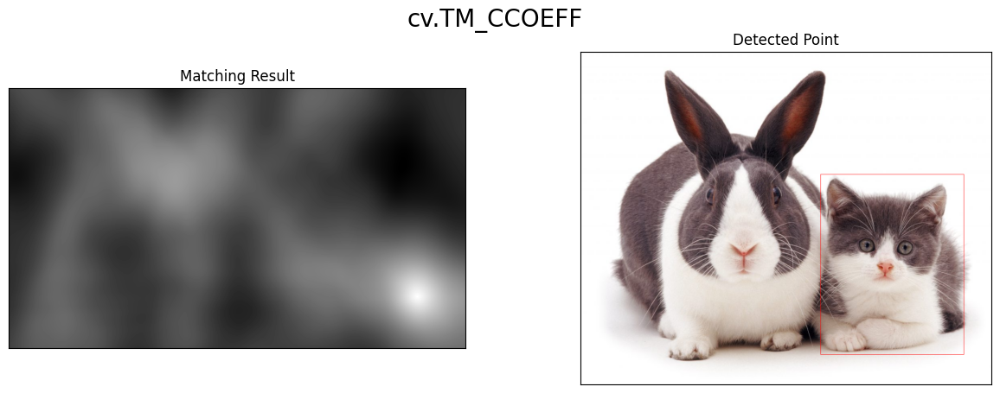

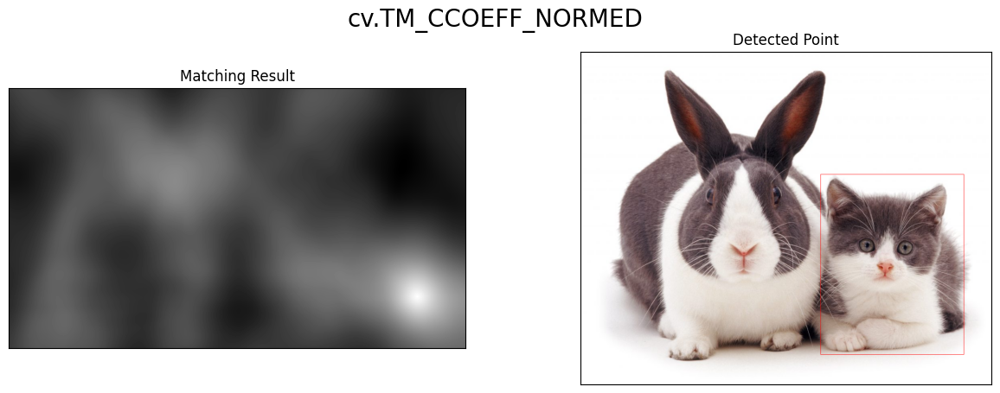

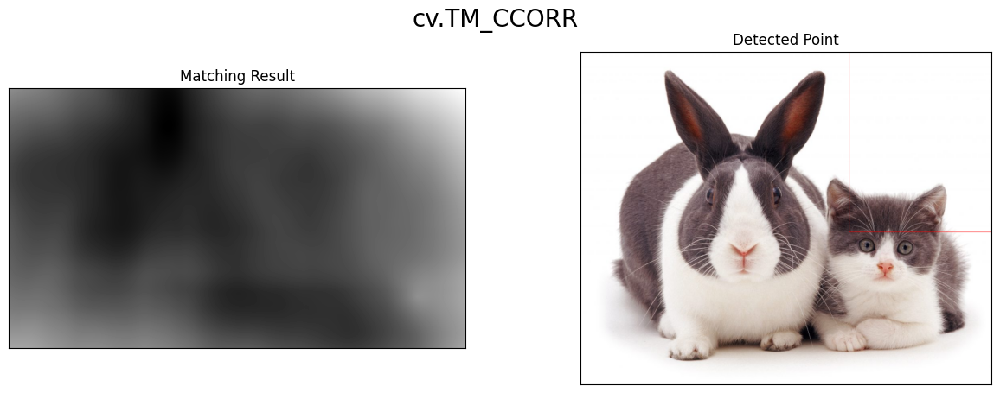

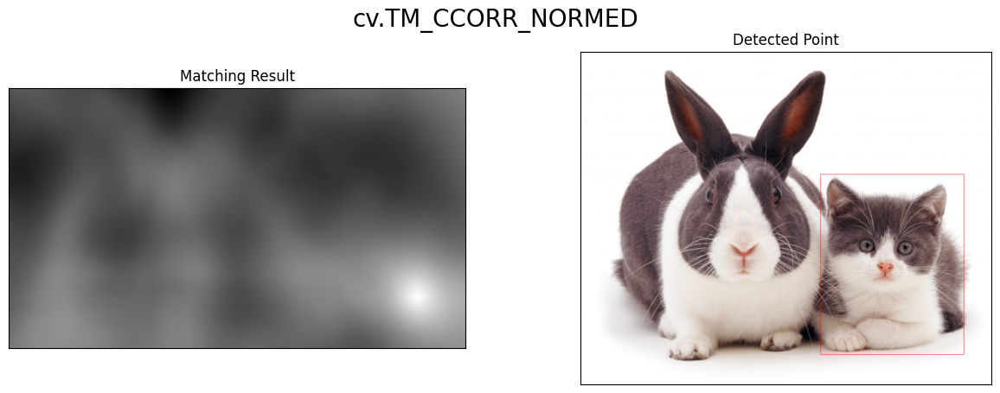

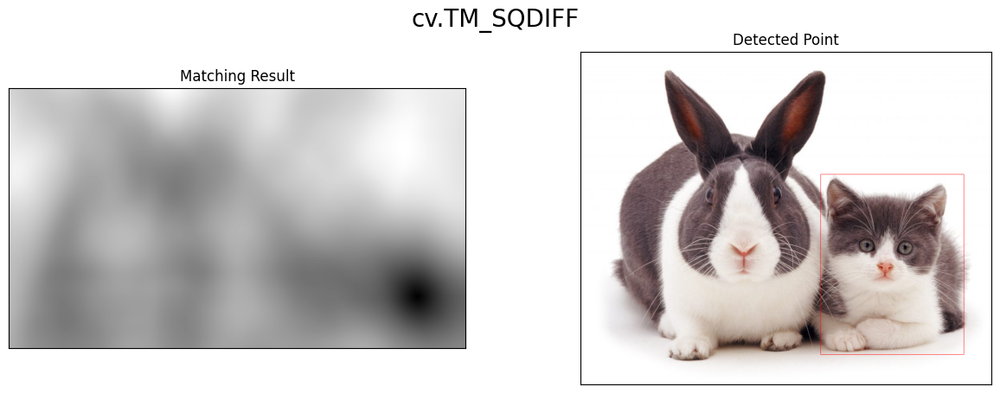

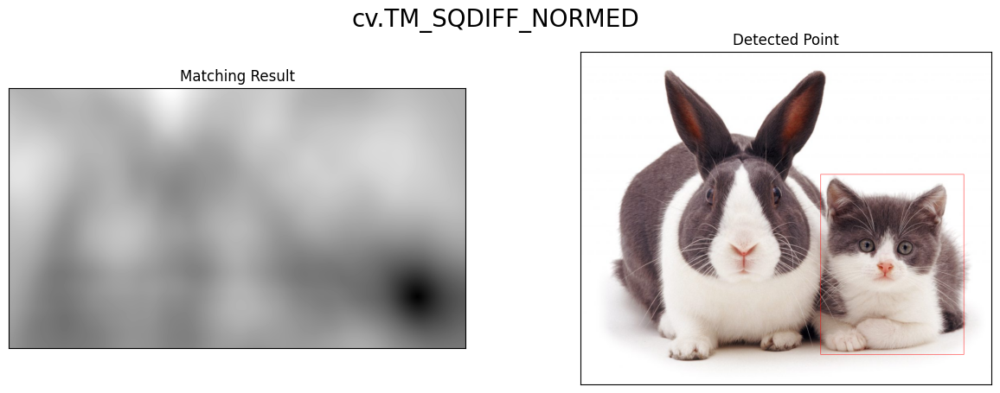

In [ ]:
# load citra input
img = cv.imread('/content/drive/MyDrive/PCVK/Images/Object Detection/cats_and_bunnies.jpg')
img_gray = cv.cvtColor(img,cv.COLOR_BGR2GRAY)
img2 = img.copy()

#load citra template
template = cv.imread('/content/drive/MyDrive/PCVK/Images/Object Detection/cat2_templatejpg.jpg',0)
# dimensi citra
w, h = template.shape[::-1]

# print input image dan template
f, axarr = plt. subplots(1,2,figsize=(15,5)) #membuat 2 plot untuk citra input dan template
axarr[0].imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB)), axarr[0].set_title("input image")
axarr[1].imshow(cv.cvtColor(template, cv.COLOR_BGR2RGB)), axarr[1].set_title("template image")

# All the 6 methods for comparison in a list
methods = ['cv.TM_CCOEFF', 'cv.TM_CCOEFF_NORMED', 'cv.TM_CCORR',
            'cv.TM_CCORR_NORMED', 'cv.TM_SQDIFF', 'cv.TM_SQDIFF_NORMED']

for meth in methods:
    img = img2.copy()
    method = eval(meth)
    # Apply template Matching
    res = cv.matchTemplate(img_gray,template,method)
    min_val, max_val, min_loc, max_loc = cv.minMaxLoc(res)
    # If the method is TM_SQDIFF or TM_SQDIFF_NORMED, take minimum
    if method in [cv.TM_SQDIFF, cv.TM_SQDIFF_NORMED]:
        top_left = min_loc
    else:
        top_left = max_loc
    bottom_right = (top_left[0] + w, top_left[1] + h)

    cv.rectangle(img,top_left, bottom_right,(0,0,255))
    plt.figure(figsize=(15,5))
    plt.subplot(121),plt.imshow(res,cmap = 'gray')
    plt.title('Matching Result'), plt.xticks([]), plt.yticks([])
    plt.subplot(122),plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
    plt.title('Detected Point'), plt.xticks([]), plt.yticks([])
    print("\n\n")
    plt.suptitle(meth, fontsize=20)
    plt.show()

3. Implementasikan konsep template matching tanpa menggunakan library OpenCV
untuk multiple object, menggunakan gambar bahrain.jpg untuk citra masukan dan
bahrain-template.jpg sebagai citra template, sehingga menghasilkan output sebagai
berikut:



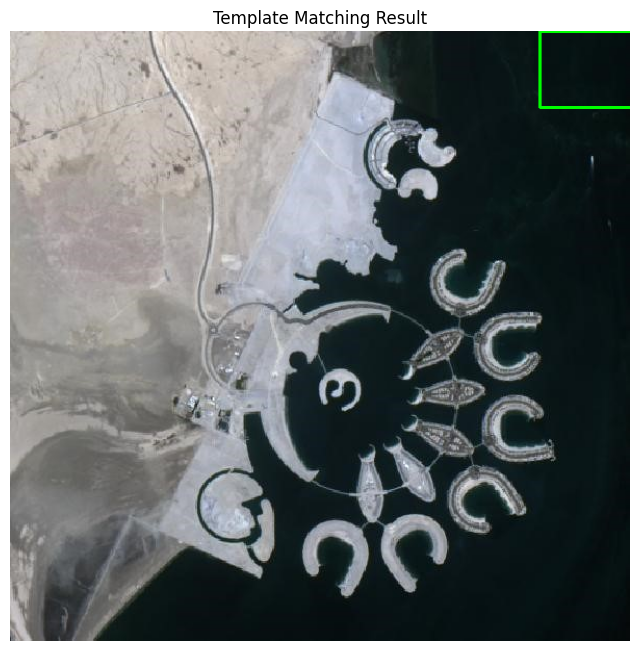

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Load the input image (bahrain.jpg) and the template image (bahrain-template.jpg)
input_image = cv2.imread('bahrain.jpg')
template = cv2.imread('bahrain-template.jpg')

# Get the dimensions of the input image and the template
input_height, input_width, _ = input_image.shape
template_height, template_width, _ = template.shape

# Create a result image to store the match scores
result_image = np.zeros((input_height, input_width))

# Perform template matching using nested loops
for y in range(input_height - template_height + 1):
    for x in range(input_width - template_width + 1):
        # Extract the region of interest (ROI) from the input image
        roi = input_image[y:y + template_height, x:x + template_width]

        # Calculate the sum of squared differences (SSD) between the ROI and the template
        ssd = np.sum((roi - template) ** 2)

        # Store the SSD value in the result image
        result_image[y, x] = ssd

# Find the location of the best match
min_ssd = np.min(result_image)
min_location = np.where(result_image == min_ssd)
best_match_y, best_match_x = min_location[0][0], min_location[1][0]

# Draw a rectangle around the best match in the input image
cv2.rectangle(input_image, (best_match_x, best_match_y), (best_match_x + template_width, best_match_y + template_height), (0, 255, 0), 2)

# Display the input image with the best match highlighted
plt.figure(figsize=(8, 8))
plt.imshow(cv2.cvtColor(input_image, cv2.COLOR_BGR2RGB))
plt.title('Template Matching Result')
plt.axis('off')
plt.show()


4. Implementasikan metode Sobel Edge Detection, Canny Edge Detection, dan Laplacian
Edge Detection pada OpenCV dengan menggunakan gambar car-park.jpg, sehingga
menghasilkan luaran sebagai berikut:


**a. Sobel Edge Detection**

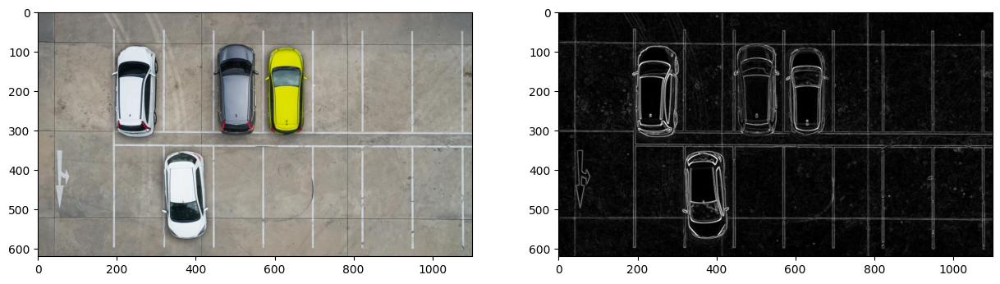

In [ ]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

img0 = cv.imread('/content/drive/MyDrive/PCVK/Images/Object Detection/car-park.jpg')

# converting to gray scale
gray = cv.cvtColor(img0, cv.COLOR_BGR2GRAY)

# remove noise
img = cv.GaussianBlur(gray, (3, 3), 0)

# obtaining a horizontal and vertical Sobel filtering of the image
img_sobelx = cv.Sobel(img, cv.CV_64F, 1, 0, ksize=3)
img_sobely = cv.Sobel(img, cv.CV_64F, 0, 1, ksize=3)

# image with both horizontal and vertical Sobel kernels applied
img_sobelxy = cv.addWeighted(cv.convertScaleAbs(img_sobelx), 0.5, cv.convertScaleAbs(img_sobely), 0.5, 0)

f, axarr = plt.subplots(1, 2, figsize=(15, 5))
plt.subplot(121), plt.imshow(cv.cvtColor(img0, cv.COLOR_BGR2RGB))
axarr[0].imshow(cv.cvtColor(img0, cv.COLOR_BGR2RGB))
plt.subplot(122), plt.imshow(img_sobelxy, cmap='gray')
axarr[1].imshow(cv.cvtColor(img_sobelxy, cv.COLOR_BGR2RGB))

plt.show()


**b. Canny Edge Detection**

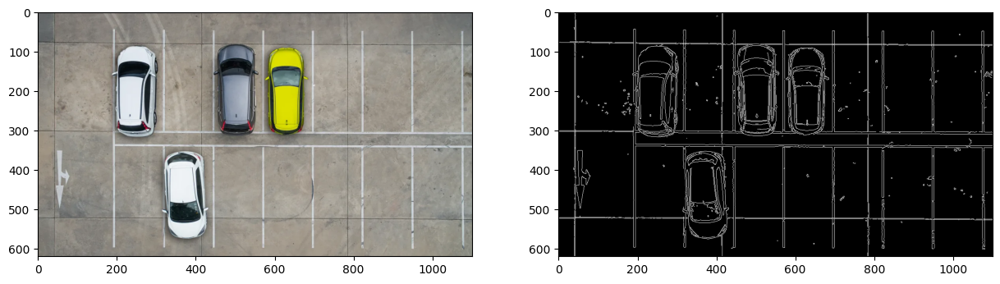

In [ ]:
edged = cv.Canny(img0, 100, 200)

# Plot outputs
f, axarr = plt.subplots(1, 2, figsize=(15, 5))
plt.subplot(121), plt.imshow(cv.cvtColor(img0, cv.COLOR_BGR2RGB))
axarr[0].imshow(cv.cvtColor(img0, cv.COLOR_BGR2RGB))
plt.subplot(122), plt.imshow(edged, cmap='gray')
axarr[1].imshow(edged, cmap='gray')

plt.show()


**c. Laplacian Edge Detection**

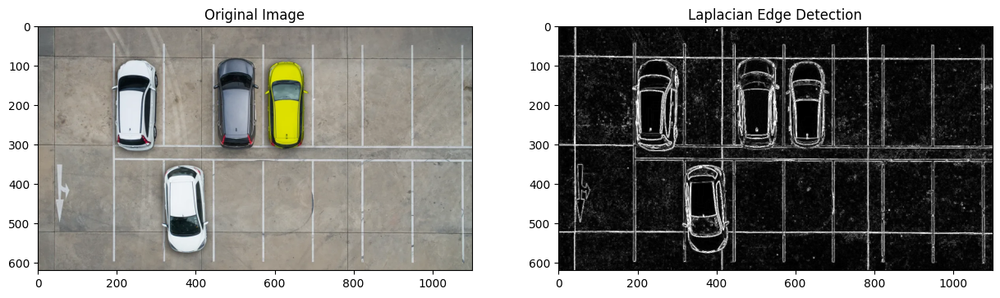

In [ ]:
# Load the input image
image_original = cv.imread('/content/drive/MyDrive/PCVK/Images/Object Detection/car-park.jpg', cv.IMREAD_COLOR)

# Convert the image to grayscale
image_gray = cv.cvtColor(image_original, cv.COLOR_BGR2GRAY)

# Apply Laplacian Edge Detection
laplacian = cv.Laplacian(image_gray, cv.CV_64F, ksize=3)
laplacian_abs = cv.convertScaleAbs(laplacian)

# Display the original image and the Laplacian edge detection result
(fig, (ax1, ax2)) = plt.subplots(1, 2, figsize=(15, 15))
ax1.title.set_text('Original Image')
ax1.imshow(cv.cvtColor(image_original, cv.COLOR_BGR2RGB))
ax2.title.set_text('Laplacian Edge Detection')
ax2.imshow(laplacian_abs, cmap='gray')

plt.show()


5. Implementasikan metode Harris Corner Detection dan Shi-Tomasi Detection pada
OpenCV dengan menggunakan gambar chess-board.jpg, sehingga menghasilkan
luaran sebagai berikut:


**a. Harris Corner Detection**

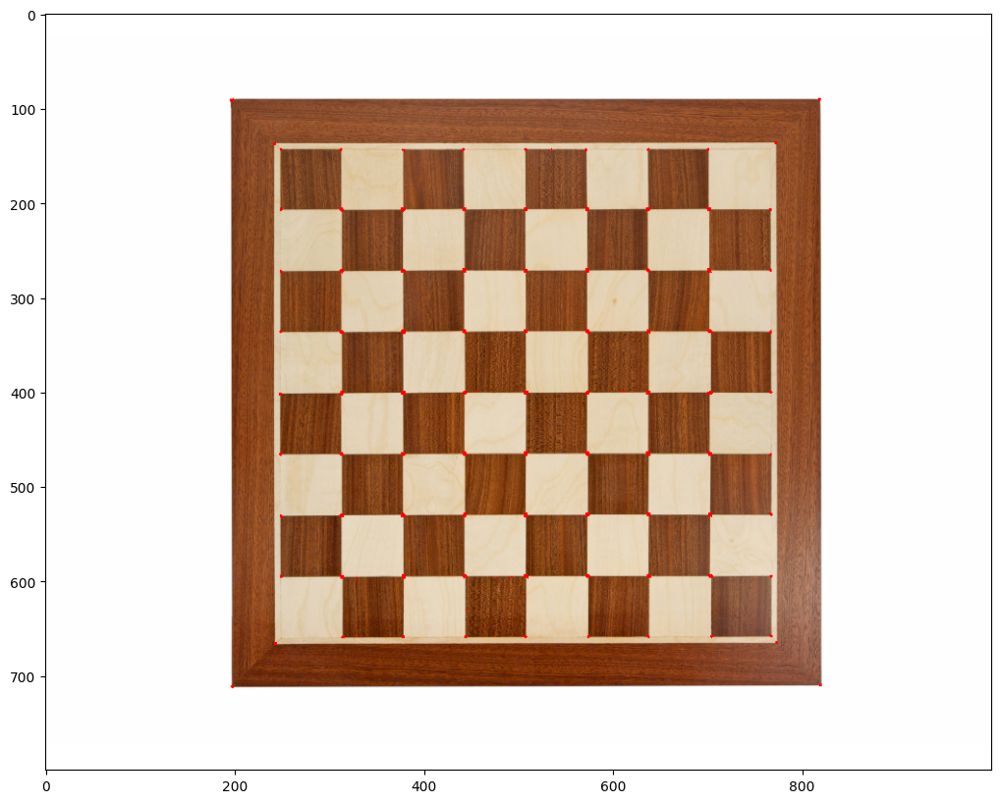

In [ ]:
img_cb = cv.imread('/content/drive/MyDrive/PCVK/Images/Object Detection/chess-board.jpg')
img_gcb = cv.cvtColor(img_cb, cv.COLOR_BGR2GRAY)
dst = cv.cornerHarris(img_gcb,3,1,0.04)

img_gray = np.float32(img_gcb)
harris_output = cv.cornerHarris(img_gray,2,3, 3)

harris_output = cv.dilate(harris_output, None)

img_cb[dst>0.01*dst.max()]=[0,0,255]

plt.figure(figsize=(20,10))
plt.imshow(cv.cvtColor(img_cb, cv.COLOR_BGR2RGB))


**b. Shi-Tomasi Detection**

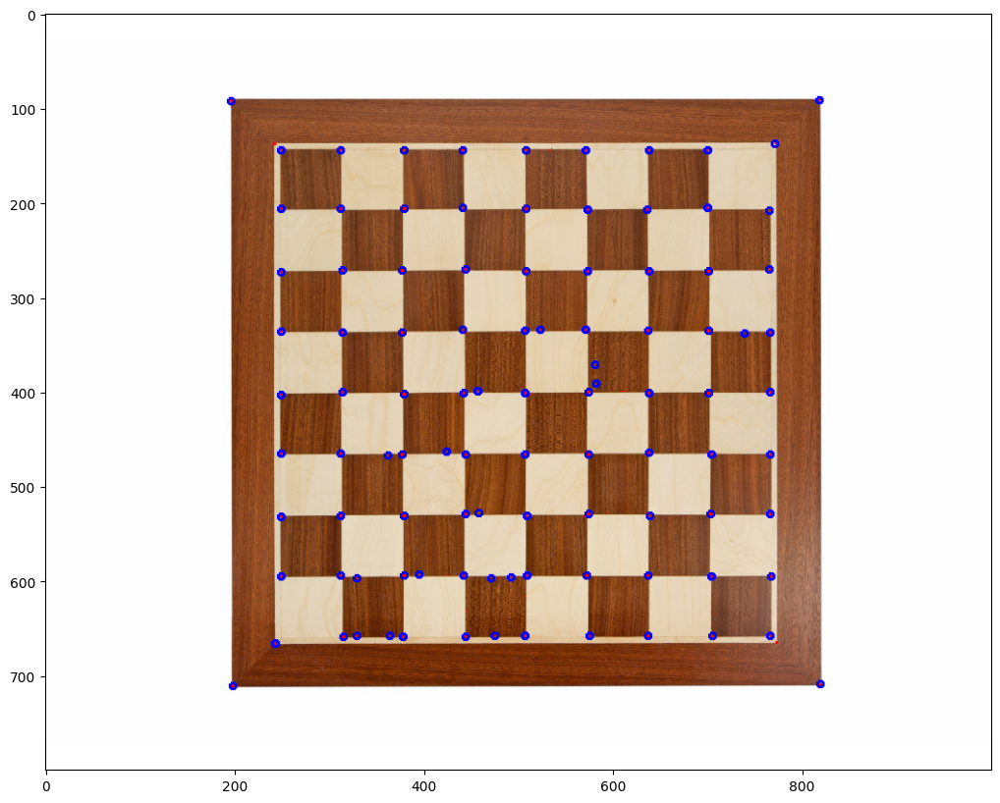

In [ ]:
corners = cv.goodFeaturesToTrack(img_gcb, 100,0.01,10)
corners = np. int0(corners)
for i in corners:
    x,y = i.ravel()
    cv.circle(img_cb, (x,y),3,255,2)

plt.figure(figsize=(20,10))
plt.imshow(cv.cvtColor(img_cb, cv.COLOR_BGR2RGB))

5. Implement the Hough Transform method in OpenCV using the sudoku.jpg image. The
stages of the grid detection process are in accordance with those contained in the
theoretical review, resulting in the following output:

number of Hough lines: 33
Number of filtered lines: 20


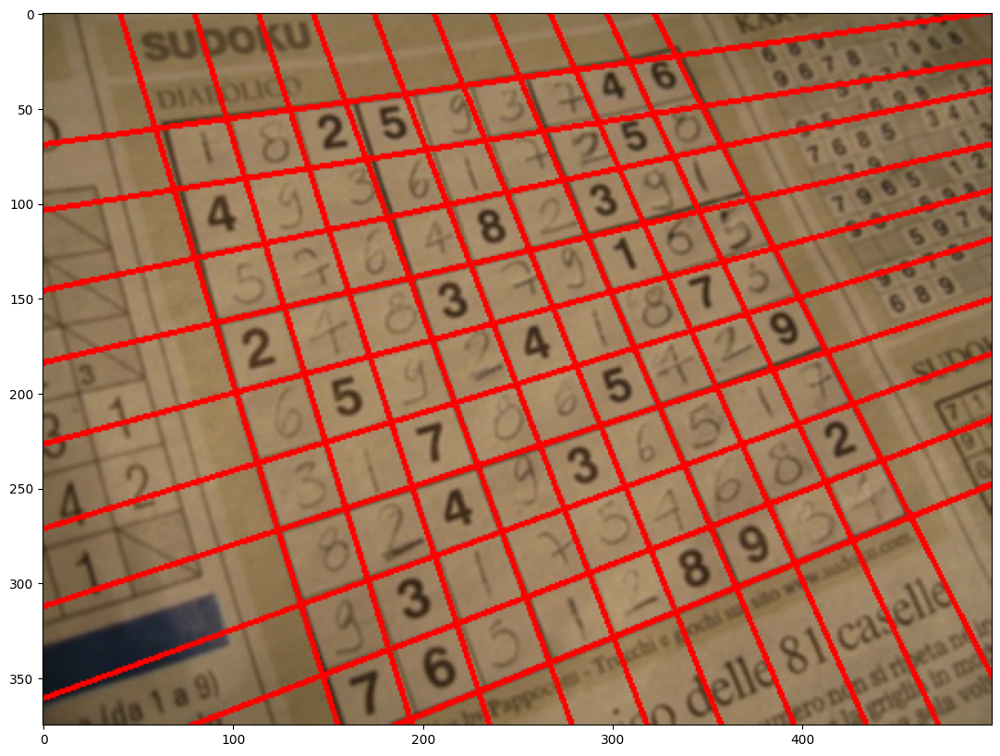

In [ ]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

img_s = cv.imread('/content/drive/MyDrive/PCVK/Images/Object Detection/sudoku.jpg')
img_gs = cv.cvtColor(img_s, cv.COLOR_BGR2GRAY)

edges = cv.Canny(img_gs, 90, 150, apertureSize=3)

kernel = np.ones((3, 3), np.uint8)
edges = cv.dilate(edges, kernel, iterations=1)

kernel = np.ones((5, 5), np.uint8)
edges = cv.erode(edges, kernel, iterations=1)

lines = cv.HoughLines(edges, 1, np.pi / 180, 150)

if not lines.any():
    print('No lines were found')
    exit()

if filter:
    rho_threshold = 15
    theta_threshold = 0.1
    similar_lines = {i: [] for i in range(len(lines))}
    for i in range(len(lines)):
        for j in range(len(lines)):
            if i == j:
                continue

            rho_i, theta_i = lines[i][0]
            rho_j, theta_j = lines[j][0]
            if abs(rho_i - rho_j) < rho_threshold and abs(theta_i - theta_j) < theta_threshold:
                similar_lines[i].append(j)

    indices = [i for i in range(len(lines))]
    indices.sort(key=lambda x: len(similar_lines[x]))

    line_flags = len(lines) * [True]
    for i in range(len(lines) - 1):
        if not line_flags[indices[i]]:
            continue

        for j in range(i + 1, len(lines)):
            if not line_flags[indices[j]]:
                continue

            rho_i, theta_i = lines[indices[i]][0]
            rho_j, theta_j = lines[indices[j]][0]
            if abs(rho_i - rho_j) < rho_threshold and abs(theta_i - theta_j) < theta_threshold:
                line_flags[indices[j]] = False

    print('number of Hough lines:', len(lines))

    filtered_lines = []

    if filter:
        for i in range(len(lines)):
            if line_flags[i]:
                filtered_lines.append(lines[i])

        print('Number of filtered lines:', len(filtered_lines))
    else:
        filtered_lines = lines

for line in filtered_lines:
    rho, theta = line[0]
    a = np.cos(theta)
    b = np.sin(theta)
    x0 = a * rho
    y0 = b * rho
    x1 = int(x0 + 1000 * (-b))
    y1 = int(y0 + 1000 * (a))
    x2 = int(x0 - 1000 * (-b))
    y2 = int(y0 - 1000 * (a))

    cv.line(img_s, (x1, y1), (x2, y2), (0, 0, 255), 2)

plt.figure(figsize=(20, 10))
plt.imshow(cv.cvtColor(img_s, cv.COLOR_BGR2RGB))
plt.show()


6. Implement the findContours () function in OpenCV for contour detection using the
laptop.jpg image, resulting in the following output:

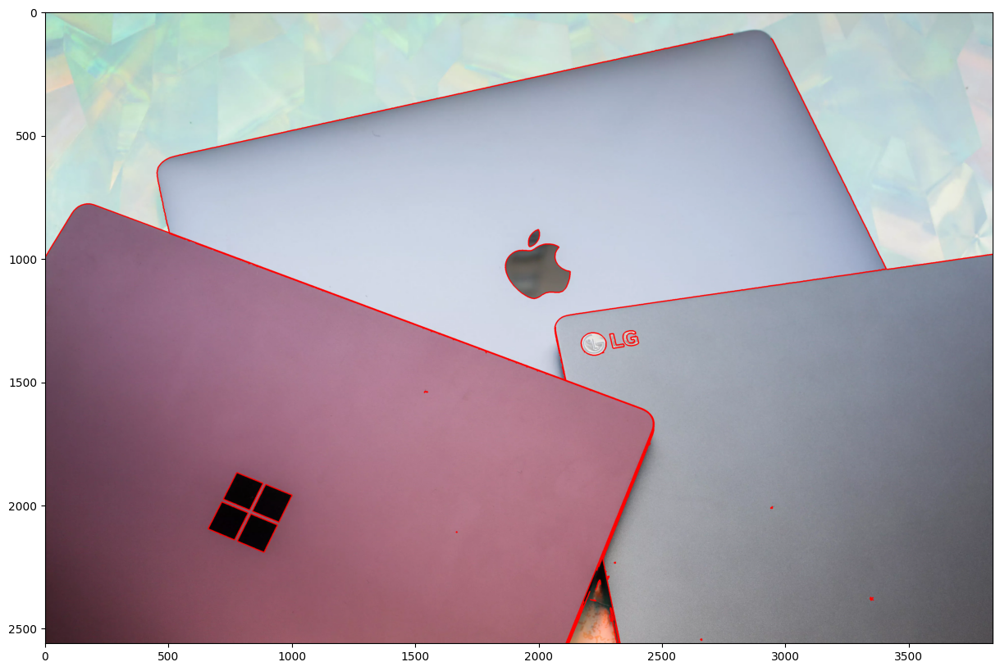

In [ ]:
img = cv.imread('/content/drive/MyDrive/PCVK/Images/Object Detection/laptop.jpg')
img_gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

edged = cv.Canny(img_gray, 30, 200)

contours, hierarchy = cv.findContours(edged, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_NONE)

cv.drawContours(img, contours, -1, (0,0,255), 3)

plt.figure(figsize=(20,10))
plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))

##**🌺E. Pengayaan Materi KTP**

1. Siapkan file dataset, contoh pada praktik ini menggunakan Maftuchin Tuban
2. Muat 2 library berikut sebagai tahapan persiapan

In [ ]:
import cv2
import os


3. Tambahkan kode lokalisasi dataset dan lakukan pembacaan file name di dalam direktori
dataset tersebut

In [ ]:
import os

# Definisikan path direktori yang ingin Anda buat
path_sliced = "dataset/sliced"

# Gunakan os.makedirs() untuk membuat direktori, termasuk direktori induk jika belum ada
os.makedirs(path_sliced, exist_ok=True)


In [ ]:
# Lokasi hasil pelat
path_plate = "dataset/sliced"
# Looping file di direktori
for name_file in sorted(os.listdir(path_plate)):
 src = cv2.imread(os.path.join(path_plate, name_file))
 blurred = src.copy()
 gray = blurred.copy()

4. Masih pada looping file direktori, terapkan Gaussian Blur untuk setiap file supaya noise pickle
dapat direduksi


In [ ]:
import cv2

# Membaca gambar dari file
src = cv2.imread('/content/drive/MyDrive/PCVK/Images/KTP_More/Salinan ktp4.png')

# Looping untuk melakukan Gaussian Blur
for i in range(10):
    blurred = cv2.GaussianBlur(src, (5, 5), 0.5)


5. Lakukan konversi grayscale untuk setiap hasil citra yang tereduksi noise dan lanjutkan dengan
binerisasi citra (thresholding)


Threshold: 168.0


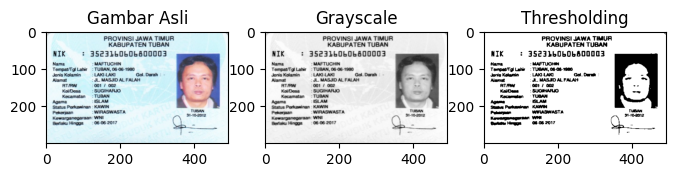

In [ ]:
# Ubah ke grayscale
gray = cv2.cvtColor(blurred, cv2.COLOR_BGR2GRAY)

# Binerisasi citra dengan thresholding (Otsu's thresholding)
ret, bw = cv2.threshold(gray.copy(), 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
print("Threshold:", ret)

# Menampilkan gambar asli
plt.figure(figsize=(8, 8))
plt.subplot(131)
plt.imshow(cv2.cvtColor(src, cv2.COLOR_BGR2RGB))
plt.title('Gambar Asli')

# Menampilkan gambar hasil konversi grayscale
plt.subplot(132)
plt.imshow(gray, cmap='gray')
plt.title('Grayscale')

# Menampilkan gambar hasil binerisasi
plt.subplot(133)
plt.imshow(bw, cmap='gray')
plt.title('Thresholding')

plt.show()

6. Terapkan morfologi untuk setiap citra yang telah mengalami binerisasi supaya setiap karakter atau obyek tidak berhimpitan.


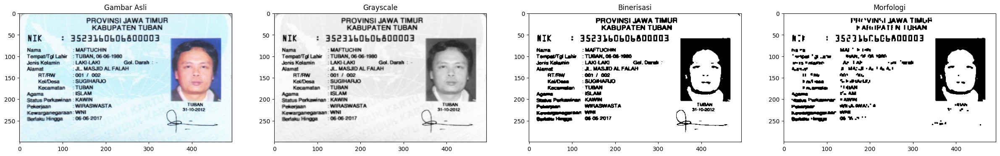

In [ ]:
# Terapkan operasi morfologi (dilasi dan erosi)
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
dilated = cv2.dilate(bw, kernel, iterations=1)
eroded = cv2.erode(dilated, kernel, iterations=1)

# Menampilkan gambar asli
plt.figure(figsize=(30, 30))
plt.subplot(141)
plt.imshow(cv2.cvtColor(src, cv2.COLOR_BGR2RGB))
plt.title('Gambar Asli')

# Menampilkan gambar hasil konversi grayscale
plt.subplot(142)
plt.imshow(gray, cmap='gray')
plt.title('Grayscale')

# Menampilkan gambar hasil binerisasi
plt.subplot(143)
plt.imshow(bw, cmap='gray')
plt.title('Binerisasi')

# Menampilkan gambar hasil dilasi
plt.subplot(144)
plt.imshow(eroded, cmap='gray')
plt.title('Morfologi')

plt.show()

7. Terapkan ekstraksi kontur untuk untuk mendapatkan semua kontur setiap karakter/obyek.
Kontur harus diseleksi berdasarkan ukuran dan rasio sebuah karakter. Karakter/obyek di
dalam KTP ini bervariasi ukuran dan rasionya, sehingga setiap karakter/obyek perlu
penanganan yang berbeda. Contoh pada praktik ini berfokus pada karakter yang seukuran
dengan NIK. Jika hasil ekstraksi kontur memperlihatkan hasil lain yaitu karakter lain
terdeteksi, hal tersebut wajar karena perlu optimize code dan preprocessing yang lebih baik
(karena hasil akuisisi setiap citra dapat berbeda).

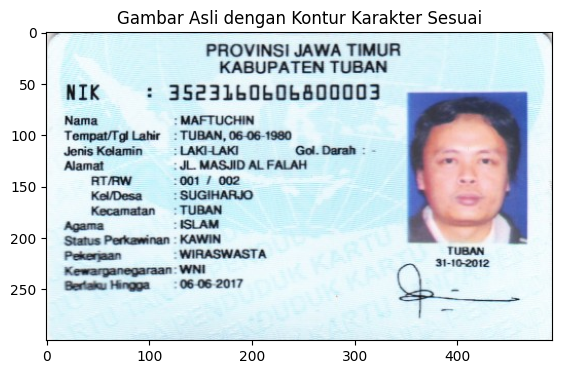

In [ ]:
# Definisikan kriteria seleksi kontur
min_width = 10  # Lebar minimum karakter
min_height = 15  # Tinggi minimum karakter
min_aspect_ratio = 0.5  # Rasio aspek minimum karakter
max_aspect_ratio = 2.0  # Rasio aspek maksimum karakter

# Looping file di direktori
for name_file in sorted(os.listdir(path_plate)):
    src = cv2.imread(os.path.join(path_plate, name_file))

    # Terapkan operasi morfologi (dilasi dan erosi)
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
    dilated = cv2.dilate(src, kernel, iterations=1)
    eroded = cv2.erode(dilated, kernel, iterations=1)

    # Ubah ke citra grayscale
    gray = cv2.cvtColor(eroded, cv2.COLOR_BGR2GRAY)

    # Temukan kontur pada citra
    contours, _ = cv2.findContours(gray, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Proses setiap kontur yang ditemukan
    for contour in contours:
        x, y, w, h = cv2.boundingRect(contour)
        aspect_ratio = float(w) / h

        # Seleksi kontur berdasarkan kriteria
        if w >= min_width and h >= min_height and min_aspect_ratio <= aspect_ratio <= max_aspect_ratio:
            # Gambar kotak pembatas pada karakter yang sesuai
            cv2.rectangle(src, (x, y), (x + w, y + h), (0, 255, 0), 2)

# Menampilkan gambar asli dengan kontur karakter yang sesuai
plt.figure(figsize=(8, 4))
plt.imshow(cv2.cvtColor(src, cv2.COLOR_BGR2RGB))
plt.title('Gambar Asli dengan Kontur Karakter Sesuai')

plt.show()

##**🌺F. Tugas Praktikum**
##**🌺KELOMPOK**

Anggota Kelompok =
1. Adinda Rahajeng Silvia Pranesti / 02 / 2141720158
2. Aminy Ghaisan Nurdiniyah / 03 / 214172
3. Thoriq Irfan Falaqh / 19 /


Setiap citra memiliki karakteristik yang berbeda. Terapkan praktik pada materi pengayaan KTP
untuk setiap dataset KTP yang tersedia. Perhatikan kondisi awal dataset, terapkan preprocessing
yang sesuai jika kualitas visual citra kurang memadai untuk segera diolah. Pengerjaan dilakukan
secara berkelompok dengan aturan sebagai berikut:
- Kelompok 2 – KTP Galang Raka Bengkulu

In [1]:
import cv2
import os

In [2]:
import os

# Definisikan path direktori yang ingin Anda buat
path_sliced = "dataset/sliced"

# Gunakan os.makedirs() untuk membuat direktori, termasuk direktori induk jika belum ada
os.makedirs(path_sliced, exist_ok=True)

In [3]:
# Lokasi hasil pelat
path_plate = "dataset/sliced"
# Looping file di direktori
for name_file in sorted(os.listdir(path_plate)):
 src = cv2.imread(os.path.join(path_plate, name_file))
 blurred = src.copy()
 gray = blurred.copy()

In [4]:
import cv2

# Membaca gambar dari file
src = cv2.imread('/content/drive/MyDrive/PCVK/Images/KTP_More/Salinan ktp1.png')

# Looping untuk melakukan Gaussian Blur
for i in range(10):
    blurred = cv2.GaussianBlur(src, (5, 5), 0.5)

Threshold: 88.0


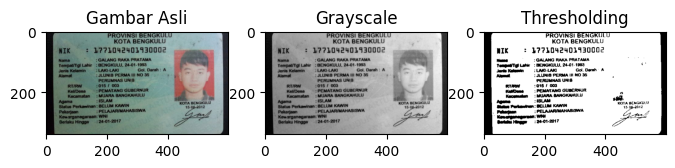

In [15]:
import cv2
import matplotlib.pyplot as plt

# Ubah ke grayscale
gray = cv2.cvtColor(blurred, cv2.COLOR_BGR2GRAY)

# Binerisasi citra dengan thresholding (Otsu's thresholding)
ret, bw = cv2.threshold(gray.copy(), 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
print("Threshold:", ret)

# Menampilkan gambar asli
plt.figure(figsize=(8, 8))
plt.subplot(131)
plt.imshow(cv2.cvtColor(src, cv2.COLOR_BGR2RGB))
plt.title('Gambar Asli')

# Menampilkan gambar hasil konversi grayscale
plt.subplot(132)
plt.imshow(gray, cmap='gray')
plt.title('Grayscale')

# Menampilkan gambar hasil binerisasi
plt.subplot(133)
plt.imshow(bw, cmap='gray')
plt.title('Thresholding')

plt.show()

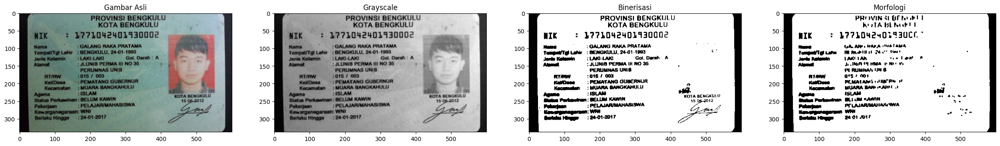

In [16]:
# Terapkan operasi morfologi (dilasi dan erosi)
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
dilated = cv2.dilate(bw, kernel, iterations=1)
eroded = cv2.erode(dilated, kernel, iterations=1)

# Menampilkan gambar asli
plt.figure(figsize=(30, 30))
plt.subplot(141)
plt.imshow(cv2.cvtColor(src, cv2.COLOR_BGR2RGB))
plt.title('Gambar Asli')

# Menampilkan gambar hasil konversi grayscale
plt.subplot(142)
plt.imshow(gray, cmap='gray')
plt.title('Grayscale')

# Menampilkan gambar hasil binerisasi
plt.subplot(143)
plt.imshow(bw, cmap='gray')
plt.title('Binerisasi')

# Menampilkan gambar hasil dilasi
plt.subplot(144)
plt.imshow(eroded, cmap='gray')
plt.title('Morfologi')

plt.show()

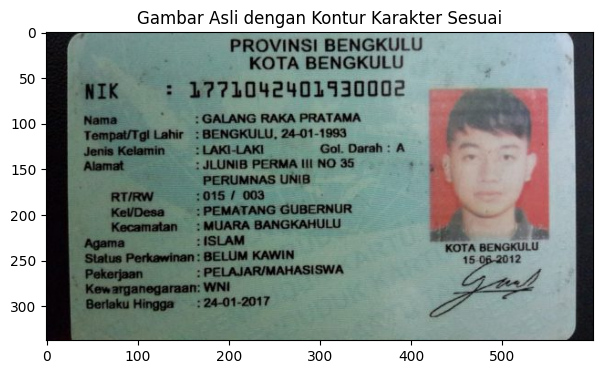

In [17]:
# Definisikan kriteria seleksi kontur
min_width = 10  # Lebar minimum karakter
min_height = 15  # Tinggi minimum karakter
min_aspect_ratio = 0.5  # Rasio aspek minimum karakter
max_aspect_ratio = 2.0  # Rasio aspek maksimum karakter

# Looping file di direktori
for name_file in sorted(os.listdir(path_plate)):
    src = cv2.imread(os.path.join(path_plate, name_file))

    # Terapkan operasi morfologi (dilasi dan erosi)
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
    dilated = cv2.dilate(src, kernel, iterations=1)
    eroded = cv2.erode(dilated, kernel, iterations=1)

    # Ubah ke citra grayscale
    gray = cv2.cvtColor(eroded, cv2.COLOR_BGR2GRAY)

    # Temukan kontur pada citra
    contours, _ = cv2.findContours(gray, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Proses setiap kontur yang ditemukan
    for contour in contours:
        x, y, w, h = cv2.boundingRect(contour)
        aspect_ratio = float(w) / h


        # Seleksi kontur berdasarkan kriteria
        if w >= min_width and h >= min_height and min_aspect_ratio <= aspect_ratio <= max_aspect_ratio:
            # Gambar kotak pembatas pada karakter yang sesuai
            cv2.rectangle(src, (x, y), (x + w, y + h), (0, 255, 0), 2)

# Menampilkan gambar asli dengan kontur karakter yang sesuai
plt.figure(figsize=(8, 4))
plt.imshow(cv2.cvtColor(src, cv2.COLOR_BGR2RGB))
plt.title('Gambar Asli dengan Kontur Karakter Sesuai')

plt.show()
